# Lens Modeling for DESIJ0215-2909

##### Author(s): Nusrath Jahan, Anowar J. Shajib, S M Rafee Adnan

In [2]:
import corner
import h5py
import joblib
import matplotlib.pyplot as plt
import numpy as np
from lenstronomy.Data.coord_transforms import Coordinates
from lenstronomy.Plots.model_plot import ModelPlot
from lenstronomy.Util import mask_util, util
from lenstronomy.Util.param_util import ellipticity2phi_q
from lenstronomy.Workflow.fitting_sequence import FittingSequence

%matplotlib inline

## Loading Data from h5 Files

In [2]:
with h5py.File("DESIJ0215-2909_F140W.h5", "r") as f:

    kwargs_data = {}
    for key in f:
        kwargs_data[key] = f[key][()]

kwargs_data

{'background_rms': 0.013773692784527593,
 'dec_at_xy_0': -4.039999999999996,
 'exposure_time': array([[406.06006, 405.521  , 526.04736, ..., 409.48416, 629.0853 ,
         482.24066],
        [518.8527 , 482.49246, 488.00433, ..., 436.29407, 406.28143,
         445.75092],
        [448.71164, 398.90408, 416.24097, ..., 429.33853, 420.62997,
         629.8828 ],
        ...,
        [509.8056 , 269.61142, 103.08534, ..., 433.3534 , 363.96698,
         452.30103],
        [446.70148, 385.2663 , 255.33597, ..., 460.0034 , 439.11295,
         640.3388 ],
        [580.9745 , 501.182  , 282.83368, ..., 383.9875 , 380.7864 ,
         368.552  ]], dtype=float32),
 'image_data': array([[-0.01862662, -0.00956936,  0.00025477, ..., -0.01687474,
         -0.01497528, -0.00593937],
        [ 0.0122624 ,  0.01622887,  0.01016984, ..., -0.0007968 ,
         -0.01004759, -0.01541612],
        [-0.005416  , -0.00861981,  0.00442341, ...,  0.0101959 ,
         -0.01310341, -0.01542239],
        ...,
   

In [3]:
with h5py.File("psf_F140W.h5", "r") as f:
    kwargs_psf = {}
    for key in f:
        kwargs_psf[key] = f[key][()]

kwargs_psf["psf_type"] = "PIXEL"

kwargs_psf

{'kernel_point_source': array([[5.7422681e-06, 4.5087054e-06, 2.4900439e-06, ..., 1.8486933e-06,
         3.2385867e-06, 4.4331632e-06],
        [3.9503216e-06, 9.9817180e-06, 6.5966469e-06, ..., 3.9997908e-06,
         6.6143798e-06, 4.1430776e-06],
        [2.9697005e-06, 5.5563592e-06, 1.2795975e-05, ..., 7.8115263e-06,
         5.1404800e-06, 1.7530243e-06],
        ...,
        [1.6921831e-06, 3.7347368e-06, 7.6415899e-06, ..., 1.1465157e-05,
         5.3933368e-06, 1.6360833e-06],
        [2.8819463e-06, 6.2348781e-06, 4.7564718e-06, ..., 4.5906190e-06,
         8.7221979e-06, 3.7005334e-06],
        [3.7170516e-06, 3.6243027e-06, 1.6518559e-06, ..., 2.0127884e-06,
         3.2246478e-06, 5.1252514e-06]], dtype=float32),
 'psf_type': 'PIXEL'}

## Loading Imaging Data

/var/folders/k8/sj0v8p9j6mq0ks525cj30mzm0000gn/T/ipykernel_94667/1084256425.py:3: RuntimeWarning: invalid value encountered in log10
  plt.matshow(np.log10(image_data), origin="lower", cmap="cubehelix")


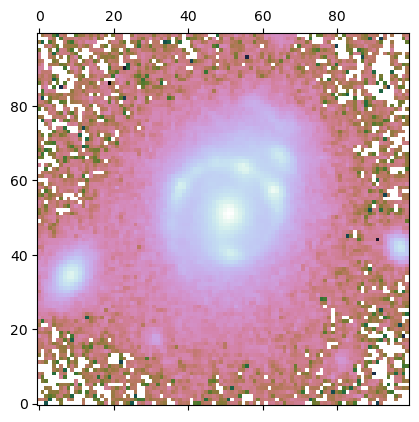

In [4]:
image_data = kwargs_data["image_data"]

plt.matshow(np.log10(image_data), origin="lower", cmap="cubehelix")

## Creating Mask

/var/folders/k8/sj0v8p9j6mq0ks525cj30mzm0000gn/T/ipykernel_94667/890060063.py:81: RuntimeWarning: divide by zero encountered in log10
  plt.matshow(np.log10(image_data * mask), origin="lower", cmap="cubehelix")
/var/folders/k8/sj0v8p9j6mq0ks525cj30mzm0000gn/T/ipykernel_94667/890060063.py:81: RuntimeWarning: invalid value encountered in log10
  plt.matshow(np.log10(image_data * mask), origin="lower", cmap="cubehelix")


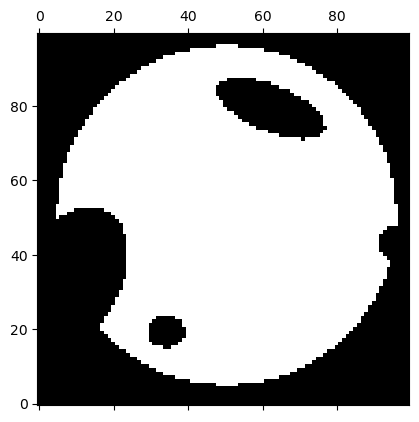

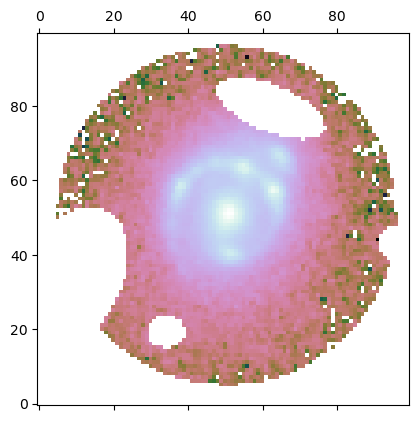

In [5]:
ra_at_xy_0 = kwargs_data["ra_at_xy_0"]
dec_at_xy_0 = kwargs_data["dec_at_xy_0"]
transform_pix2angle = kwargs_data["transform_pix2angle"]


coords = Coordinates(transform_pix2angle, ra_at_xy_0, dec_at_xy_0)
num_pix = len(kwargs_data["image_data"])

x_coords, y_coords = coords.coordinate_grid(num_pix, num_pix)

r = 3.65  #  arcsecond
lens_center_ra = 0
lens_center_dec = 0

mask_outer = mask_util.mask_center_2d(
    lens_center_ra,
    lens_center_dec,
    r,
    util.image2array(x_coords),
    util.image2array(y_coords),
)

mask_ext_1 = mask_util.mask_ellipse(
    util.image2array(x_coords),
    util.image2array(y_coords),
    lens_center_ra + 1.3,
    lens_center_dec - 2.5,
    0.4,
    0.35,
    0,
)

mask_ext_2 = mask_util.mask_ellipse(
    util.image2array(x_coords),
    util.image2array(y_coords),
    lens_center_ra + 3.4,
    lens_center_dec - 1.4,
    1.7,
    1.1,
    np.pi / 1.5,
)

mask_ext_3 = mask_util.mask_ellipse(
    util.image2array(x_coords),
    util.image2array(y_coords),
    lens_center_ra - 3.65,
    lens_center_dec - 0.6,
    0.4,
    0.4,
    0,
)

mask_ext_5 = mask_util.mask_ellipse(
    util.image2array(x_coords),
    util.image2array(y_coords),
    lens_center_ra - 0.95,
    lens_center_dec + 2.3,
    1.25,
    0.5,
    np.pi / 0.89,
)


mask = (
    (1 - mask_outer)
    * (1 - mask_ext_1)
    * (1 - mask_ext_2)
    * (1 - mask_ext_3)
    * (1 - mask_ext_5)
)

mask[mask >= 1] = 1
mask[mask < 0] = 0

mask = mask.reshape(100, 100)

plt.matshow(mask, origin="lower", cmap="cubehelix")
plt.matshow(np.log10(image_data * mask), origin="lower", cmap="cubehelix")

## Lens Modeling with Lenstronomy

In [6]:
lens_model_list = ["EPL", "SHEAR"]
source_model_list = ["SERSIC_ELLIPSE", "SHAPELETS", "SHAPELETS"]
lens_light_model_list = ["SERSIC_ELLIPSE", "SERSIC_ELLIPSE"]

## Lens Galaxy's Mass Model

### EPL Parameters

In [7]:
fixed_lens = []
kwargs_lens_init = []
kwargs_lens_sigma = []
kwargs_lower_lens = []
kwargs_upper_lens = []

fixed_lens.append({})
kwargs_lens_init.append(
    {
        "theta_E": 1.0553,
        "gamma": 1.9414,
        "e1": -0.2146,
        "e2": -0.068,
        "center_x": -0.0165,
        "center_y": 0.0172,
    }
)
kwargs_lens_sigma.append(
    {
        "theta_E": 0.2,
        "gamma": 0.01,
        "e1": 0.05,
        "e2": 0.05,
        "center_x": 0.5,
        "center_y": 0.5,
    }
)
kwargs_lower_lens.append(
    {
        "theta_E": 0.01,
        "gamma": 1.8,
        "e1": -0.5,
        "e2": -0.5,
        "center_x": -10,
        "center_y": -10,
    }
)
kwargs_upper_lens.append(
    {
        "theta_E": 10.0,
        "gamma": 2.3,
        "e1": 0.5,
        "e2": 0.5,
        "center_x": 10,
        "center_y": 10,
    }
)

### Shear Parameters

In [8]:
fixed_lens.append({"ra_0": 0, "dec_0": 0})

kwargs_lens_init.append({"gamma1": -0.0052, "gamma2": -0.0063})
kwargs_lens_sigma.append({"gamma1": 0.01, "gamma2": 0.01})
kwargs_lower_lens.append({"gamma1": -0.3, "gamma2": -0.3})
kwargs_upper_lens.append({"gamma1": 0.3, "gamma2": 0.3})

lens_params = [
    kwargs_lens_init,
    kwargs_lens_sigma,
    fixed_lens,
    kwargs_lower_lens,
    kwargs_upper_lens,
]

## Source Galaxy's Light Model

### Sersic Ellipse Parameters

In [9]:
fixed_source = []
kwargs_source_init = []
kwargs_source_sigma = []
kwargs_lower_source = []
kwargs_upper_source = []

fixed_source.append({"n_sersic": 1.0})
kwargs_source_init.append(
    {
        "R_sersic": 0.0053,
        "n_sersic": 1,
        "e1": 0.4055,
        "e2": -0.4628,
        "center_x": -0.1627,
        "center_y": 0.3527,
        "amp": 1,
    }
)
kwargs_source_sigma.append(
    {
        "n_sersic": 0.5,
        "R_sersic": 0.001,
        "e1": 0.05,
        "e2": 0.05,
        "center_x": 0.2,
        "center_y": 0.2,
        "amp": 1,
    }
)
kwargs_lower_source.append(
    {
        "e1": -0.5,
        "e2": -0.5,
        "R_sersic": 0.001,
        "n_sersic": 0.5,
        "center_x": -10,
        "center_y": -10,
        "amp": 0,
    }
)
kwargs_upper_source.append(
    {
        "e1": 0.5,
        "e2": 0.5,
        "R_sersic": 0.2,
        "n_sersic": 5.0,
        "center_x": 10,
        "center_y": 10,
        "amp": 100,
    }
)

### 1st Shapelets Parameters

In [10]:
fixed_source.append({"n_max": 10})
kwargs_source_init.append({"center_x": 0.0, "center_y": 0.0, "beta": 0.1706})
kwargs_source_sigma.append({"center_x": 0.2, "center_y": 0.2, "beta": 0.001})
kwargs_lower_source.append({"center_x": -10, "center_y": -10, "beta": 0.001})
kwargs_upper_source.append({"center_x": 10, "center_y": 10, "beta": 0.2})

joint_shapelets_with_sersic = [[0, 1, ["center_x", "center_y"]]]

### 2nd Shapelets Parameters

In [11]:
fixed_source.append({"n_max": 10})
kwargs_source_init.append({"center_x": 0.0299, "center_y": 0.1150, "beta": 0.0207})
kwargs_source_sigma.append({"center_x": 0.2, "center_y": 0.2, "beta": 0.001})
kwargs_lower_source.append({"center_x": -10, "center_y": -10, "beta": 0.001})
kwargs_upper_source.append({"center_x": 10, "center_y": 10, "beta": 0.2})

source_params = [
    kwargs_source_init,
    kwargs_source_sigma,
    fixed_source,
    kwargs_lower_source,
    kwargs_upper_source,
]

## Lens Galaxy's Light Model

### 1st Sersic Ellipse Parameters

In [12]:
fixed_lens_light = []
kwargs_lens_light_init = []
kwargs_lens_light_sigma = []
kwargs_lower_lens_light = []
kwargs_upper_lens_light = []

fixed_lens_light.append({"n_sersic": 1.0})

kwargs_lens_light_init.append(
    {
        "R_sersic": 2.2986,
        "n_sersic": 2,
        "e1": -0.1863,
        "e2": -0.1808,
        "center_x": -0.0640,
        "center_y": 0.0420,
        "amp": 16,
    }
)
kwargs_lens_light_sigma.append(
    {
        "n_sersic": 1,
        "R_sersic": 0.3,
        "e1": 0.05,
        "e2": 0.05,
        "center_x": 0.1,
        "center_y": 0.1,
        "amp": 1,
    }
)
kwargs_lower_lens_light.append(
    {
        "e1": -0.5,
        "e2": -0.5,
        "R_sersic": 0.001,
        "n_sersic": 0.5,
        "center_x": -10,
        "center_y": -10,
        "amp": 0,
    }
)
kwargs_upper_lens_light.append(
    {
        "e1": 0.5,
        "e2": 0.5,
        "R_sersic": 10,
        "n_sersic": 5.0,
        "center_x": 10,
        "center_y": 10,
        "amp": 100,
    }
)

### 2nd Sersic Ellipse Parameters

In [13]:
fixed_lens_light.append({"n_sersic": 4.0})

kwargs_lens_light_init.append(
    {
        "R_sersic": 0.8096,
        "n_sersic": 2,
        "e1": -0.0834,
        "e2": -0.0134,
        "center_x": 0.0,
        "center_y": 0,
        "amp": 16,
    }
)
kwargs_lens_light_sigma.append(
    {
        "n_sersic": 1,
        "R_sersic": 0.3,
        "e1": 0.05,
        "e2": 0.05,
        "center_x": 0.1,
        "center_y": 0.1,
        "amp": 1,
    }
)
kwargs_lower_lens_light.append(
    {
        "e1": -0.5,
        "e2": -0.5,
        "R_sersic": 0.001,
        "n_sersic": 0.5,
        "center_x": -10,
        "center_y": -10,
        "amp": 0,
    }
)
kwargs_upper_lens_light.append(
    {
        "e1": 0.5,
        "e2": 0.5,
        "R_sersic": 10,
        "n_sersic": 5.0,
        "center_x": 10,
        "center_y": 10,
        "amp": 100,
    }
)

joint_lens_light_with_lens_light = [[0, 1, ["center_x", "center_y", "e1", "e2"]]]

lens_light_params = [
    kwargs_lens_light_init,
    kwargs_lens_light_sigma,
    fixed_lens_light,
    kwargs_lower_lens_light,
    kwargs_upper_lens_light,
]

In [14]:
def custom_log_likelihood_addition(
    kwargs_lens=None,
    kwargs_source=None,
    kwargs_lens_light=None,
    kwargs_ps=None,
    kwargs_special=None,
    kwargs_extinction=None,
):
    """

    :param kwargs_lens: lens mass model keywords

    :type kwargs_lens: list

    :param kwargs_source: source light model keywords

    :type kwargs_source: list

    :param kwargs_lens_light: lens light model keywords

    :type kwargs_lens_light:  list

    :param kwargs_ps: point source keywords

    :type kwargs_ps: list

    :param kwargs_special: special keywords

    :type kwargs_special: list

    :param kwargs_extinction: extinction model keywords

    :type kwargs_extinction: list

    :return: custom log_likelihood

    :rtype: float

    """

    log_likelihood = 0.0

    mass_phi, mass_q = ellipticity2phi_q(kwargs_lens[0]["e1"], kwargs_lens[0]["e2"])
    light_phi, light_q = ellipticity2phi_q(
        kwargs_lens_light[0]["e1"], kwargs_lens_light[0]["e2"]
    )

    gaussian_std = 0.01
    if mass_q < light_q:
        log_likelihood += -0.5 * (mass_q - light_q) ** 2 / gaussian_std**2

    return log_likelihood

In [15]:
# Combining all the above specification in the `kwargs_params` dictionary


kwargs_params = {
    "lens_model": lens_params,
    "source_model": source_params,
    "lens_light_model": lens_light_params,
}

kwargs_constraints = {
    "joint_lens_light_with_lens_light": joint_lens_light_with_lens_light,
    "joint_source_with_source": joint_shapelets_with_sersic,
}

In [16]:
kwargs_likelihood = {
    "custom_logL_addition": custom_log_likelihood_addition,
    "check_bounds": True,
    "image_likelihood_mask_list": [mask],
}

kwargs_numerics = {"supersampling_factor": 1, "supersampling_convolution": False}

In [17]:
kwargs_model = {
    "lens_model_list": lens_model_list,
    "source_light_model_list": source_model_list,
    "lens_light_model_list": lens_light_model_list,
}

multi_band_list = [[kwargs_data, kwargs_psf, kwargs_numerics]]

kwargs_data_joint = {
    "multi_band_list": multi_band_list,
    "multi_band_type": "single-band"
    # 'multi-linear': every imaging band
    # has independent solutions of the
    # surface brightness, 'joint-linear':
    # there is one joint solution of the
    # linear coefficients demanded across the bands.
}

## The Model Fitting

In [18]:
fitting_seq = FittingSequence(
    kwargs_data_joint,
    kwargs_model,
    kwargs_constraints,
    kwargs_likelihood,
    kwargs_params,
)

fitting_kwargs_list = [
    ["update_settings", {"lens_add_fixed": [[0, ["gamma"]]]}],
    ["PSO", {"sigma_scale": 1.0, "n_particles": 500, "n_iterations": 200}],
]

chain_list = fitting_seq.fit_sequence(fitting_kwargs_list)
kwargs_result = fitting_seq.best_fit()

Computing the PSO ...
10
20
30
40
50
60
70
80
90
100
110
120
130
140
150
160
170
180
190
200
Max iteration reached! Stopping.
-0.9868145508145812 reduced X^2 of best position
-2744.8246730907576 log likelihood
5563 effective number of data points
[{'theta_E': 1.0511022479383465, 'gamma': 1.9414, 'e1': -0.19570424645201978, 'e2': -0.02610869856970691, 'center_x': -0.02767288633874518, 'center_y': 0.027797147198348564}, {'gamma1': -0.003223504690668406, 'gamma2': -0.004977032993174431, 'ra_0': 0, 'dec_0': 0}] lens result
[{'amp': 1, 'R_sersic': 0.0021347536089767073, 'n_sersic': 1.0, 'e1': 0.28217629589106247, 'e2': -0.4478088086947617, 'center_x': -0.18265210066939916, 'center_y': 0.35843925287336664}, {'amp': 1, 'n_max': 10, 'beta': 0.16335886580895675, 'center_x': -0.18265210066939916, 'center_y': 0.35843925287336664}, {'amp': 1, 'n_max': 10, 'beta': 0.017713862753765002, 'center_x': 0.0346151123185655, 'center_y': 0.11897533753895938}] source result
[{'amp': 1, 'R_sersic': 2.16048386

In [19]:
kwargs_result = fitting_seq.best_fit(bijective=False)
multi_band_list_out = fitting_seq.multi_band_list
kwargs_fixed_out = fitting_seq.kwargs_fixed()

init_samples = None  # can be not `None` for MCMC

input = [
    fitting_kwargs_list,
    multi_band_list,
    kwargs_model,
    kwargs_constraints,
    kwargs_likelihood,
    kwargs_params,
    init_samples,
]

output = [kwargs_result, multi_band_list_out, chain_list, kwargs_fixed_out]

output_path = "./DESIJ0215-2909_pso_output_new_init1.joblib"

with open(output_path, "wb") as f:
    joblib.dump([input, output], f, compress=True)

## Visualizing the Fitted Model

from copy import deepcopy
kwargs_result_copy = deepcopy(kwargs_result)

kwargs_result_copy['kwargs_source'][1]['beta'] = 0.05

-0.95972890667509 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  0.9597289066755821


/opt/anaconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:43: RuntimeWarning: divide by zero encountered in log10
  log_model = np.log10(model)
/opt/anaconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',
/opt/anaconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:136: RuntimeWarning: divide by zero encountered in log10
  im = ax.matshow(np.log10(self._model), origin='lower', vmin=v_min, vmax=v_max,


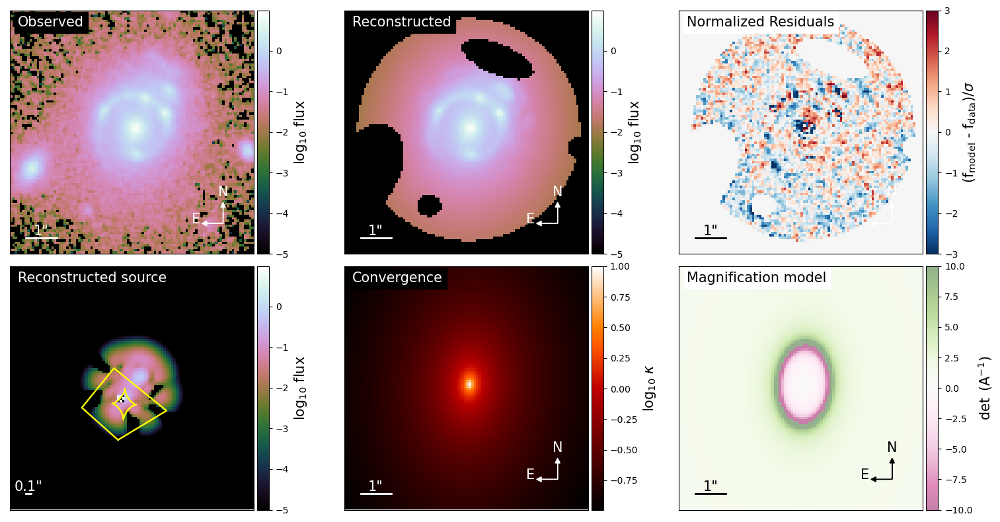

In [20]:
model_plot = ModelPlot(
    multi_band_list,
    kwargs_model,
    kwargs_result,
    arrow_size=0.02,
    cmap_string="cubehelix",
    image_likelihood_mask_list=kwargs_likelihood["image_likelihood_mask_list"],
)

f, axes = plt.subplots(2, 3, figsize=(16, 8), sharex=False, sharey=False)

model_plot.data_plot(ax=axes[0, 0])
model_plot.model_plot(ax=axes[0, 1])

model_plot.normalized_residual_plot(ax=axes[0, 2], v_min=-3, v_max=3, cmap="RdBu_r")

model_plot.source_plot(
    ax=axes[1, 0], deltaPix_source=0.05, numPix=100, with_caustics=True
)

model_plot.convergence_plot(ax=axes[1, 1], v_max=1, cmap="gist_heat")
model_plot.magnification_plot(ax=axes[1, 2], cmap="PiYG")
f.tight_layout()
f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.0, hspace=0.05)
plt.show()

/opt/anaconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:506: RuntimeWarning: divide by zero encountered in log10
  im = ax.matshow(np.log10(model), origin='lower', vmin=v_min, vmax=v_max,
/opt/anaconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:506: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(model), origin='lower', vmin=v_min, vmax=v_max,


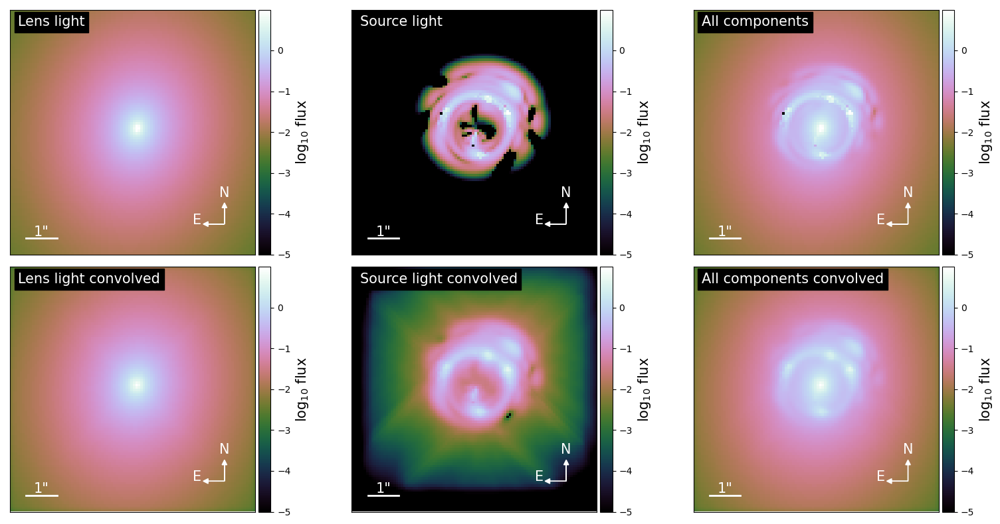

{'kwargs_lens': [{'theta_E': 1.0511022479383465, 'gamma': 1.9414, 'e1': -0.19570424645201978, 'e2': -0.02610869856970691, 'center_x': -0.02767288633874518, 'center_y': 0.027797147198348564}, {'gamma1': -0.003223504690668406, 'gamma2': -0.004977032993174431, 'ra_0': 0, 'dec_0': 0}], 'kwargs_source': [{'amp': -23755351.565015674, 'R_sersic': 0.0021347536089767073, 'n_sersic': 1.0, 'e1': 0.28217629589106247, 'e2': -0.4478088086947617, 'center_x': -0.18265210066939916, 'center_y': 0.35843925287336664}, {'amp': array([ 215.84812873,  -12.94484142,   53.87403075,   45.98894051,
       -177.14758138,  147.32158456,    2.98464587,   20.5718087 ,
        -32.06388194,   16.0438049 ,  -19.63653873,   34.9773529 ,
         70.65126526,  -46.45207892,   -3.38470022,    6.86106215,
        -15.01446743,    4.02034679,    5.47542143,    8.93741002,
          2.91831213,   20.73201673,    0.52078341,  -36.40793136,
        -21.46533479,   14.62728455,   24.91390068,   28.58502788,
         -3.0051056

In [21]:
f, axes = plt.subplots(2, 3, figsize=(16, 8), sharex=False, sharey=False)

model_plot.decomposition_plot(
    ax=axes[0, 0], text="Lens light", lens_light_add=True, unconvolved=True
)
model_plot.decomposition_plot(
    ax=axes[1, 0], text="Lens light convolved", lens_light_add=True
)
model_plot.decomposition_plot(
    ax=axes[0, 1], text="Source light", source_add=True, unconvolved=True
)
model_plot.decomposition_plot(
    ax=axes[1, 1], text="Source light convolved", source_add=True
)
model_plot.decomposition_plot(
    ax=axes[0, 2],
    text="All components",
    source_add=True,
    lens_light_add=True,
    unconvolved=True,
)
model_plot.decomposition_plot(
    ax=axes[1, 2],
    text="All components convolved",
    source_add=True,
    lens_light_add=True,
    point_source_add=True,
)
f.tight_layout()
f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.0, hspace=0.05)
plt.show()
print(kwargs_result)

# MCMC

In [22]:
mcmc_backend = "mcmc_backend_init.h5"

fitting_kwargs_list_mcmc = [
    ["update_settings", {"lens_remove_fixed": [[0, ["gamma"]]]}],
    [
        "MCMC",
        {
            "n_burn": 0,
            "n_run": 10000,
            "n_walkers": 100,
            "sigma_scale": 0.1,
            "threadCount": 3,
            "backend_filename": mcmc_backend,
            "start_from_backend": False,
        },
    ],
]

chain_list_mcmc = fitting_seq.fit_sequence(fitting_kwargs_list_mcmc)
kwargs_result_mcmc = fitting_seq.best_fit()

/opt/anaconda3/lib/python3.9/site-packages/emcee/ensemble.py:255: RuntimeWarning: Initial state is not linearly independent and it will not allow a full exploration of parameter space
  warnings.warn(
100%|██████████████████████████████████| 10000/10000 [22:23:29<00:00,  8.06s/it]


Computing the MCMC...
Number of walkers =  100
Burn-in iterations:  0
Sampling iterations (in current run): 10000
80616.46685886383 time taken for MCMC sampling


# MCMC: Visualizing the Fitted Model

In [ ]:
samples_mcmc = []  # initialization of an empty list to store mcmc samples

if chain_list_mcmc[-1][0] != "PSO":
    # if MCMC chain was broken in the chunks,
    # we join the chunks to make the full chain
    mcmc_repeat = 1

    for k in range(len(chain_list_mcmc) - mcmc_repeat, len(chain_list_mcmc)):
        if samples_mcmc == []:
            samples_mcmc = chain_list_mcmc[k][1]
        else:
            samples_mcmc = np.vstack((samples_mcmc, chain_list_mcmc[k][1]))

        param_mcmc = chain_list_mcmc[k][2]

print(samples_mcmc.shape)

if not samples_mcmc == []:
    n_params = samples_mcmc.shape[1]
    n_walkers = 100
    n_step = int(samples_mcmc.shape[0] / n_walkers)
    n_burn = 0

    print("N_step: {}, N_walkers: {}, N_params: {}".format(n_step, n_walkers, n_params))

    chain = np.empty((n_walkers, n_step, n_params))

    for i in range(n_params):
        samples = samples_mcmc[:, i]
        reshaped_samples = samples.reshape((n_walkers, n_step), order="F")
        chain[:, :, i] = reshaped_samples

    mean_pos = np.zeros((n_params, n_step))
    median_pos = np.zeros((n_params, n_step))
    std_pos = np.zeros((n_params, n_step))
    q16_pos = np.zeros((n_params, n_step))
    q84_pos = np.zeros((n_params, n_step))

    for i in range(n_params):
        for j in range(n_step):
            mean_pos[i][j] = np.mean(chain[:, j, i])
            median_pos[i][j] = np.median(chain[:, j, i])
            std_pos[i][j] = np.std(chain[:, j, i])
            q16_pos[i][j] = np.percentile(chain[:, j, i], 16.0)
            q84_pos[i][j] = np.percentile(chain[:, j, i], 84.0)

    fig, ax = plt.subplots(n_params, sharex=True, figsize=(8, 6))

    burnin = -1
    last = n_step

    medians = []

    param_values = [
        median_pos[0][last - 1],
        (q84_pos[0][last - 1] - q16_pos[0][last - 1]) / 2,
        median_pos[1][last - 1],
        (q84_pos[1][last - 1] - q16_pos[1][last - 1]) / 2,
    ]

    for i in range(n_params):
        print(
            param_mcmc[i],
            "{:.4f} ± {:.4f}".format(
                median_pos[i][last - 1],
                (q84_pos[i][last - 1] - q16_pos[i][last - 1]) / 2,
            ),
        )

        ax[i].plot(median_pos[i][:last], c="g")
        ax[i].axhline(np.median(median_pos[i][burnin:last]), c="r", lw=1)
        ax[i].fill_between(
            np.arange(last), q84_pos[i][:last], q16_pos[i][:last], alpha=0.4
        )

        ax[i].set_ylabel(param_mcmc[i], fontsize=10)
        ax[i].set_xlim(0, last)

        medians.append(np.median(median_pos[i][burnin:last]))

    if True:
        fig.set_size_inches((12.0, 2 * len(param_mcmc)))
        plt.show()

(1000000, 23)
N_step: 10000, N_walkers: 100, N_params: 23


/var/folders/k8/sj0v8p9j6mq0ks525cj30mzm0000gn/T/ipykernel_94667/2694604456.py:18: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if not samples_mcmc == []:


theta_E_lens0 1.0522 ± 0.0020
gamma_lens0 1.9311 ± 0.0098
e1_lens0 -0.1999 ± 0.0071
e2_lens0 -0.0281 ± 0.0076
center_x_lens0 -0.0238 ± 0.0050
center_y_lens0 0.0240 ± 0.0045
gamma1_lens1 -0.0061 ± 0.0033
gamma2_lens1 -0.0073 ± 0.0042
R_sersic_source_light0 0.0029 ± 0.0012
e1_source_light0 0.2968 ± 0.0821
e2_source_light0 -0.4384 ± 0.0694
center_x_source_light0 -0.1745 ± 0.0077
center_y_source_light0 0.3581 ± 0.0090
beta_source_light1 0.1639 ± 0.0013
beta_source_light2 0.0171 ± 0.0010
center_x_source_light2 0.0316 ± 0.0071
center_y_source_light2 0.1147 ± 0.0063
R_sersic_lens_light0 2.2046 ± 0.1012
e1_lens_light0 -0.0976 ± 0.0041
e2_lens_light0 -0.0385 ± 0.0035
center_x_lens_light0 -0.0639 ± 0.0007
center_y_lens_light0 0.0421 ± 0.0015
R_sersic_lens_light1 0.7864 ± 0.0275


(1000000, 23)
N_step: 10000, N_walkers: 100, N_params: 23


/var/folders/k8/sj0v8p9j6mq0ks525cj30mzm0000gn/T/ipykernel_94667/2184240398.py:18: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if not samples_mcmc == []:


theta_E_lens0 1.0522 ± 0.0020
gamma_lens0 1.9311 ± 0.0098
e1_lens0 -0.1999 ± 0.0071
e2_lens0 -0.0281 ± 0.0076
center_x_lens0 -0.0238 ± 0.0050
center_y_lens0 0.0240 ± 0.0045
gamma1_lens1 -0.0061 ± 0.0033
gamma2_lens1 -0.0073 ± 0.0042
R_sersic_source_light0 0.0029 ± 0.0012
e1_source_light0 0.2968 ± 0.0821
e2_source_light0 -0.4384 ± 0.0694
center_x_source_light0 -0.1745 ± 0.0077
center_y_source_light0 0.3581 ± 0.0090
beta_source_light1 0.1639 ± 0.0013
beta_source_light2 0.0171 ± 0.0010
center_x_source_light2 0.0316 ± 0.0071
center_y_source_light2 0.1147 ± 0.0063
R_sersic_lens_light0 2.2046 ± 0.1012
e1_lens_light0 -0.0976 ± 0.0041
e2_lens_light0 -0.0385 ± 0.0035
center_x_lens_light0 -0.0639 ± 0.0007
center_y_lens_light0 0.0421 ± 0.0015
R_sersic_lens_light1 0.7864 ± 0.0275


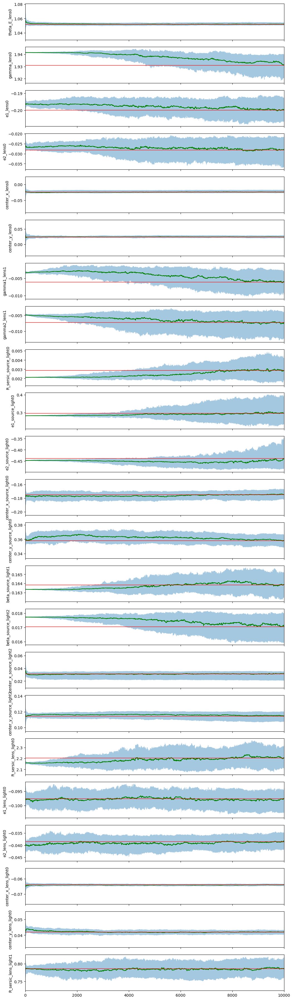

In [43]:
samples_mcmc = []  # initialization of an empty list to store mcmc samples

if chain_list_mcmc[-1][0] != "PSO":
    # if MCMC chain was broken in the chunks,
    # we join the chunks to make the full chain
    mcmc_repeat = 1

    for k in range(len(chain_list_mcmc) - mcmc_repeat, len(chain_list_mcmc)):
        if samples_mcmc == []:
            samples_mcmc = chain_list_mcmc[k][1]
        else:
            samples_mcmc = np.vstack((samples_mcmc, chain_list_mcmc[k][1]))

        param_mcmc = chain_list_mcmc[k][2]

print(samples_mcmc.shape)

if not samples_mcmc == []:
    n_params = samples_mcmc.shape[1]
    n_walkers = 100
    n_step = int(samples_mcmc.shape[0] / n_walkers)
    n_burn = 0

    print("N_step: {}, N_walkers: {}, N_params: {}".format(n_step, n_walkers, n_params))

    chain = np.empty((n_walkers, n_step, n_params))

    for i in range(n_params):

        samples = samples_mcmc[:, i].T
        chain[:, :, i] = samples.reshape((n_step, n_walkers)).T
        # samples = samples_mcmc[:, i]
        # reshaped_samples = samples.reshape((n_walkers, n_step), order="F")
        # chain[:, :, i] = reshaped_samples

    mean_pos = np.zeros((n_params, n_step))
    median_pos = np.zeros((n_params, n_step))
    std_pos = np.zeros((n_params, n_step))
    q16_pos = np.zeros((n_params, n_step))
    q84_pos = np.zeros((n_params, n_step))

    for i in range(n_params):
        for j in range(n_step):
            mean_pos[i][j] = np.mean(chain[:, j, i])
            median_pos[i][j] = np.median(chain[:, j, i])
            std_pos[i][j] = np.std(chain[:, j, i])
            q16_pos[i][j] = np.percentile(chain[:, j, i], 16.0)
            q84_pos[i][j] = np.percentile(chain[:, j, i], 84.0)

    fig, ax = plt.subplots(n_params, sharex=True, figsize=(8, 6))

    burnin = -1
    last = n_step

    medians = []

    param_values = [
        median_pos[0][last - 1],
        (q84_pos[0][last - 1] - q16_pos[0][last - 1]) / 2,
        median_pos[1][last - 1],
        (q84_pos[1][last - 1] - q16_pos[1][last - 1]) / 2,
    ]

    for i in range(n_params):
        print(
            param_mcmc[i],
            "{:.4f} ± {:.4f}".format(
                median_pos[i][last - 1],
                (q84_pos[i][last - 1] - q16_pos[i][last - 1]) / 2,
            ),
        )

        ax[i].plot(median_pos[i][:last], c="g")
        ax[i].axhline(np.median(median_pos[i][burnin:last]), c="r", lw=1)
        ax[i].fill_between(
            np.arange(last), q84_pos[i][:last], q16_pos[i][:last], alpha=0.4
        )

        ax[i].set_ylabel(param_mcmc[i], fontsize=10)
        ax[i].set_xlim(0, last)

        medians.append(np.median(median_pos[i][burnin:last]))

    # if True:
    fig.set_size_inches((12.0, 2 * len(param_mcmc)))
    plt.show()

In [26]:
chain.shape

(100, 10000, 23)

Number of non-linear parameters in the MCMC process: 23
Parameters in order: ['theta_E_lens0', 'gamma_lens0', 'e1_lens0', 'e2_lens0', 'center_x_lens0', 'center_y_lens0', 'gamma1_lens1', 'gamma2_lens1', 'R_sersic_source_light0', 'e1_source_light0', 'e2_source_light0', 'center_x_source_light0', 'center_y_source_light0', 'beta_source_light1', 'beta_source_light2', 'center_x_source_light2', 'center_y_source_light2', 'R_sersic_lens_light0', 'e1_lens_light0', 'e2_lens_light0', 'center_x_lens_light0', 'center_y_lens_light0', 'R_sersic_lens_light1']
Number of evaluations in the MCMC process: 1000000
1000000
Shape of samples_mcmc_cut: (4586, 23)


/var/folders/k8/sj0v8p9j6mq0ks525cj30mzm0000gn/T/ipykernel_94667/2697576055.py:30: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  if not samples_mcmc_cut == []:


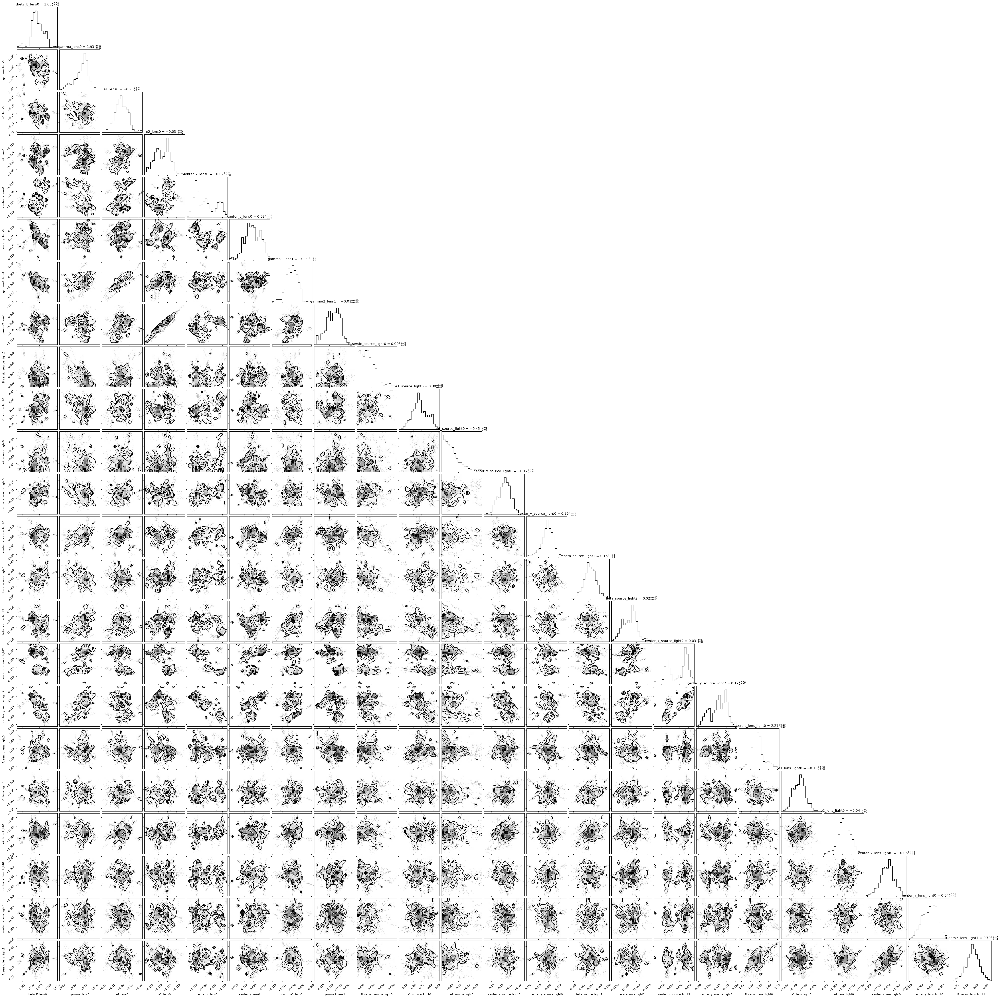

In [57]:
if len(chain_list_mcmc) > 0:
    sampler_type, samples_mcmc, param_mcmc, dist_mcmc = chain_list_mcmc[0]

    param_class = fitting_seq.param_class

    print("Number of non-linear parameters in the MCMC process:", len(param_mcmc))
    print("Parameters in order:", param_mcmc)
    if samples_mcmc is not None:
        print("Number of evaluations in the MCMC process:", np.shape(samples_mcmc)[0])
        n_sample = len(samples_mcmc)
        print(n_sample)
        burnin = 9000
        thin = 20

        samples_mcmc_cut = chain[:, burnin::thin, :].reshape((-1, n_params))

        # sigma-clipping
        for i in range(n_params):
            median = np.median(samples_mcmc_cut[:, i])
            mad = np.median(np.absolute(samples_mcmc_cut[:, i] - median))

            clip_sigma = 4.0
            indices = np.argwhere(
                (samples_mcmc_cut[:, i] < (median + clip_sigma * mad / 0.6744))
                & (samples_mcmc_cut[:, i] > (median - clip_sigma * mad / 0.6744))
            )

            samples_mcmc_cut = samples_mcmc_cut[indices[:, 0], :]

        if not samples_mcmc_cut == []:
            n, num_param = np.shape(samples_mcmc_cut)
            print("Shape of samples_mcmc_cut:", samples_mcmc_cut.shape)
            plot = corner.corner(samples_mcmc_cut, labels=param_mcmc, show_titles=True)

        # samples_mcmc_cut = chain[:, burnin::thin, :].reshape((-1, n_params))
        # if not samples_mcmc_cut == []:
        # n, num_param = np.shape(samples_mcmc_cut)
        # print("Shape of samples_mcmc_cut:", samples_mcmc_cut.shape)
        # plot = corner.corner(samples_mcmc_cut, labels=param_mcmc, show_titles=True)
    else:
        print("No samples available for corner plot.")
else:
    print("No MCMC chains available.")

-0.957242011415007 reduced X^2 of all evaluated imaging data combined (without degrees of freedom subtracted).
reduced chi^2 of data  0 =  0.9572420113858572


/opt/anaconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:43: RuntimeWarning: divide by zero encountered in log10
  log_model = np.log10(model)
/opt/anaconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:101: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',
/opt/anaconda3/lib/python3.9/site-packages/lenstronomy/Plots/model_band_plot.py:136: RuntimeWarning: divide by zero encountered in log10
  im = ax.matshow(np.log10(self._model), origin='lower', vmin=v_min, vmax=v_max,


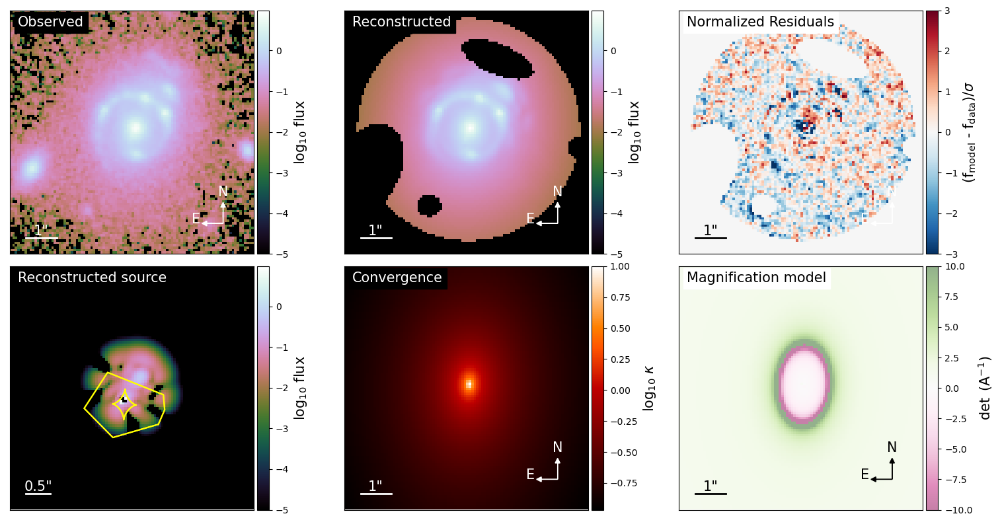

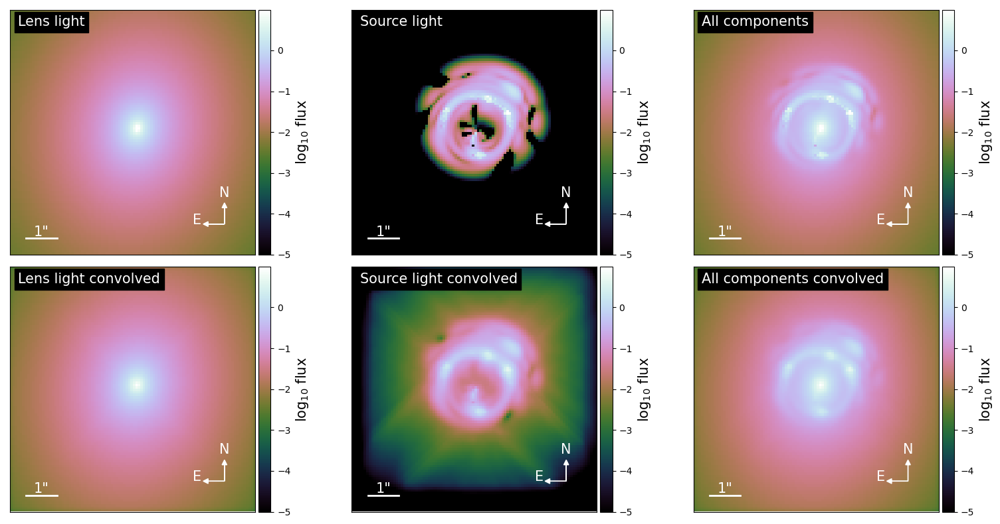

{'kwargs_lens': [{'theta_E': 1.0529560366446258, 'gamma': 1.9235217696453495, 'e1': -0.19160774420202037, 'e2': -0.02221562850967661, 'center_x': -0.01676831942044673, 'center_y': 0.025357945439643422}, {'gamma1': -0.0043394142800757055, 'gamma2': -0.004208975429310149, 'ra_0': 0, 'dec_0': 0}], 'kwargs_source': [{'amp': -2982.082075028977, 'R_sersic': 0.0026860037360621415, 'n_sersic': 1.0, 'e1': 0.358553917907095, 'e2': -0.28054050574112244, 'center_x': -0.1663178537008055, 'center_y': 0.3641754366969873}, {'amp': array([ 2.16052639e+02, -2.84376189e+01,  4.94192694e+01,  4.60987662e+01,
       -1.75044222e+02,  1.40916939e+02,  3.84734486e-02,  3.36804094e+01,
       -2.61750062e+01,  1.62664519e+00, -1.95734685e+01,  3.15963407e+01,
        6.92783403e+01, -4.11199876e+01, -3.96055735e+00,  9.97785811e+00,
       -1.86521705e+01, -4.84432024e+00, -1.85647597e-01,  1.73747607e+01,
        7.41763033e+00,  1.97436535e+01,  3.09871910e+00, -3.33503139e+01,
       -2.22581115e+01,  1.31

In [37]:
model_plot = ModelPlot(
    multi_band_list,
    kwargs_model,
    kwargs_result_mcmc,
    arrow_size=0.02,
    cmap_string="cubehelix",
    image_likelihood_mask_list=kwargs_likelihood["image_likelihood_mask_list"],
    linear_solver=kwargs_constraints.get("linear_solver", True),
)

f, axes = plt.subplots(2, 3, figsize=(16, 8), sharex=False, sharey=False)

model_plot.data_plot(ax=axes[0, 0])
model_plot.model_plot(ax=axes[0, 1])
model_plot.normalized_residual_plot(ax=axes[0, 2], v_min=-3, v_max=3, cmap="RdBu_r")
model_plot.source_plot(
    ax=axes[1, 0], deltaPix_source=0.05, numPix=100, with_caustics=True, scale_size=0.5
)
model_plot.convergence_plot(ax=axes[1, 1], v_max=1, cmap="gist_heat")
model_plot.magnification_plot(ax=axes[1, 2], cmap="PiYG")
f.tight_layout()
f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.0, hspace=0.05)
plt.show()

f, axes = plt.subplots(2, 3, figsize=(16, 8), sharex=False, sharey=False)

model_plot.decomposition_plot(
    ax=axes[0, 0], text="Lens light", lens_light_add=True, unconvolved=True
)
model_plot.decomposition_plot(
    ax=axes[1, 0], text="Lens light convolved", lens_light_add=True
)
model_plot.decomposition_plot(
    ax=axes[0, 1], text="Source light", source_add=True, unconvolved=True
)
model_plot.decomposition_plot(
    ax=axes[1, 1], text="Source light convolved", source_add=True
)
model_plot.decomposition_plot(
    ax=axes[0, 2],
    text="All components",
    source_add=True,
    lens_light_add=True,
    unconvolved=True,
)
model_plot.decomposition_plot(
    ax=axes[1, 2],
    text="All components convolved",
    source_add=True,
    lens_light_add=True,
    point_source_add=True,
)
f.tight_layout()
f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.0, hspace=0.05)
plt.show()
print(kwargs_result_mcmc)

In [3]:
result_mass_e1 = kwargs_result_mcmc["kwargs_lens"][0]["e1"]
result_mass_e2 = kwargs_result_mcmc["kwargs_lens"][0]["e2"]

result_light_e1 = kwargs_result_mcmc["kwargs_lens_light"][0]["e1"]
result_light_e2 = kwargs_result_mcmc["kwargs_lens_light"][0]["e2"]

mass_phi, mass_q = ellipticity2phi_q(result_mass_e1, result_mass_e2)
light_phi, light_q = ellipticity2phi_q(result_light_e1, result_light_e2)

print(
    "mass_q: {},\nlight_q: {}".format(
        mass_q,
        light_q,
    )
)

mass_q: 0.6765986678603894,
light_q: 0.8053042251451261


In [ ]:
multi_band_list_out = fitting_seq.multi_band_list
kwargs_fixed_out = fitting_seq.kwargs_fixed

init_samples = n_step  # can be not `None` for MCMC

input = [
    fitting_kwargs_list_mcmc,
    multi_band_list,
    kwargs_model,
    kwargs_constraints,
    kwargs_likelihood,
    kwargs_params,
    init_samples,
]

output = [kwargs_result_mcmc, multi_band_list_out, kwargs_fixed_out]

output_path = "DESIJ0201-2739_mcmc_output.joblib"

with open(output_path, "wb") as f:
    joblib.dump([input, output], f, compress=True)